# Final Project

`Use Case` : The credit score classification model aims to predict the creditworthiness of individuals based on various financial and credit-related features. Using historical data on individuals' financial behavior and credit history, the model predicts the credit score of the individual. This predictive model is valuable for financial institutions such as banks, credit unions, and lending agencies to assess the risk associated with extending credit to individuals.

`Description of Features` :
1. **Annual Income** : The yearly income of the individual.
2. **Monthly Inhand Salary** : The monthly salary available after deductions.
3. **Number of Bank Accounts** : The total number of bank accounts owned by the individual.
4. **Number of Credit Cards** : The total number of credit cards held by the individual.
5. **Interest Rate** : The interest rate applicable to the individual's loans or credit cards.
6. **Number of Loans** : The total number of loans held by the individual.
7. **Delay from Due Date** : The number of days the individual's payments are delayed from the due date.
8. **Number of Delayed Payments** : The total number of payments delayed by the individual.
9. **Changed Credit Limit** : Any changes in the individual's credit limit over time.
10. **Number of Credit Inquiries** : The number of times the individual's credit report has been accessed by lenders.
11. **Outstanding Debt** : The total amount of debt the individual owes.
12. **Credit Utilization Ratio** : The ratio of credit used to the total credit available.
13. **Credit History Age in Months** : The age of the individual's credit history in months.
14. **Total EMI per Month** : The total Equated Monthly Installment (EMI) amount paid by the individual.
15. **Amount Invested Monthly** : The amount invested by the individual in various financial instruments per month.
16. **Monthly Balance** : The individual's monthly balance in their bank accounts.
17. **Payment of Minimum Amount (Encoded)** : Encoded information about the individual's payment of minimum amounts due.
18. **Payment Behaviour (Encoded)** : Encoded information about the individual's payment behavior.
19. **Credit Mix (Encoded)** : Encoded information about the diversity of credit types used by the individual.

`Prediction Errors` :
1. **False Negative** : False negatives will occur if the model incorrectly classifies 'Good' credit score as 'Bad' when they are actually at a lower credit risk. This can lead to the rejection of credit applications from individuals who are creditworthy which will result missed business opportunities for the lending institution.

2. **False Positive** : False positives will occur when the model incorrectly classifies 'Bad' credit score as 'Good' when they are actually at a higher credit risk. This will result in approval of credit applications from individuals who are actually at a high credit risk. This increases the risk of financial losses for the lending institution.

So in my opinion both of them posses higher risks for lending instituitions. Balancing the trade-offs between false positives and false negatives will be optimal for making lending decisions and maximizing business outcomes while minimizing financial risks.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings
from sklearn.impute import KNNImputer
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree, export_text
from sklearn.svm import SVC
import utils

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [2]:
df = pd.read_csv('./credit score classification/credit_score_classification.csv')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [32]:
df.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_in_months,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Occupation_Accountant,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Payment_Behaviour_High spent Large value payments,Payment_Behaviour_High spent Medium value payments,Payment_Behaviour_High spent Small value payments,Payment_Behaviour_Low spent Large value payments,Payment_Behaviour_Low spent Medium value payments,Payment_Behaviour_Low spent Small value payments,Credit_Mix_Bad,Credit_Mix_Good,Credit_Mix_Standard
0,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.1,809.98,35.030402,273.0,0.0,49.574949,236.642682,186.266702,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0
1,24.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,9.0,13.27,4.0,809.98,33.053114,274.0,0.0,49.574949,21.465380,361.444004,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
2,24.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,23.6,4.0,12.27,4.0,809.98,33.811894,208.8,0.0,49.574949,148.233938,264.675446,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
3,36.4,19114.12,1456.462500,3.0,4.0,3.0,4.0,4.0,5.0,11.27,4.0,809.98,32.430559,276.0,0.0,49.574949,39.082511,343.826873,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
5,28.0,34847.84,3037.986667,2.0,4.0,6.0,1.0,3.0,3.0,5.42,5.0,605.03,30.116600,328.0,0.0,18.816215,251.627369,303.355083,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0


In [4]:
rearranging_columns = [col for col in df.columns if col != 'Credit_Mix'] + ['Credit_Mix']

# Reorder the DataFrame columns
df = df[rearranging_columns]

In [5]:
num_rows, num_columns = df.shape

print(f"Number of rows    : {num_rows}")
print(f"Number of columns : {num_columns}")

Number of rows    : 50000
Number of columns : 27


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        50000 non-null  object 
 1   Customer_ID               50000 non-null  object 
 2   Month                     50000 non-null  object 
 3   Name                      44985 non-null  object 
 4   Age                       50000 non-null  object 
 5   SSN                       50000 non-null  object 
 6   Occupation                50000 non-null  object 
 7   Annual_Income             50000 non-null  object 
 8   Monthly_Inhand_Salary     42502 non-null  float64
 9   Num_Bank_Accounts         50000 non-null  int64  
 10  Num_Credit_Card           50000 non-null  int64  
 11  Interest_Rate             50000 non-null  int64  
 12  Num_of_Loan               50000 non-null  object 
 13  Type_of_Loan              44296 non-null  object 
 14  Delay_

In [7]:
null_values_count = df.isnull().sum()

print(f"Null values count for each column : \n{null_values_count}")
print('\n\n')
print(f"Total null values in the DataFrame: {null_values_count.sum()}")

Null values count for each column : 
ID                             0
Customer_ID                    0
Month                          0
Name                        5015
Age                            0
SSN                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary       7498
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                5704
Delay_from_due_date            0
Num_of_Delayed_Payment      3498
Changed_Credit_Limit           0
Num_Credit_Inquiries        1035
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          4470
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     2271
Payment_Behaviour              0
Monthly_Balance              562
Credit_Mix                     0
dtype: int64



Total null values in the DataFrame: 30053


# Dropping the unnecessary columns

In [8]:
columns = ['ID', 'Customer_ID','Month', 'Name', 'Type_of_Loan', 'SSN']
# Dropping the columns that are not needed
def drop_col(df, columns):
    for i in columns:
        df.drop(i, axis = 1, inplace = True)
        
drop_col(df, columns)

# Cleaning corrupted values

In [9]:
columns_to_clean = ['Age', 'Occupation','Annual_Income', 'Num_of_Delayed_Payment',
                    'Num_of_Loan', 'Changed_Credit_Limit', 'Interest_Rate',
                   'Outstanding_Debt', 'Monthly_Balance', 'Amount_invested_monthly', 'Credit_Mix']
corruption_pattern = r'[_<>@!_______]'

# Define a function to clean columns based on regex pattern
def clean_column_with_regex(df, columns, pattern):
    """
    Cleans specified columns by replacing values that match the given regex pattern with NaN.

    Parameters:
    df (pd.DataFrame): DataFrame containing the data
    columns (list): List of column names to clean
    pattern (str): Regex pattern to identify corrupted values
    
    Returns:
    pd.DataFrame: Cleaned DataFrame with corrupted values replaced by NaN
    """
    # Loop through the specified columns
    for column in columns:
        # Apply regex to detect corrupted values and replace them with NaN
        df[column] = df[column].apply(lambda x: np.nan if isinstance(x, str) and re.search(pattern, x) else x)

    return df


df = clean_column_with_regex(df, columns_to_clean, corruption_pattern)

In [10]:
df['Payment_Behaviour'].unique(), df['Payment_Behaviour'].nunique()

(array(['Low_spent_Small_value_payments',
        'High_spent_Medium_value_payments',
        'Low_spent_Medium_value_payments',
        'High_spent_Large_value_payments',
        'Low_spent_Large_value_payments', '!@9#%8',
        'High_spent_Small_value_payments'], dtype=object),
 7)

In [11]:
# Replace underscores with spaces and replace the invalid string with NaN
df['Payment_Behaviour'] = df['Payment_Behaviour'].str.replace('_', ' ').replace('!@9#%8', np.nan)
df['Payment_of_Min_Amount'] = df['Payment_of_Min_Amount'].replace({'Yes': 1, 'No': 0, 'NM': np.nan})

In [12]:
# Updated function to handle NaN or non-string values
def age_to_months(x):
    # Check if x is a valid string, else return NaN
    if isinstance(x, str):
        age_split = x.split(' ')
        years = int(age_split[0])
        months = int(age_split[3])
        total_months = years * 12 + months
        return total_months
    else:
        # Return NaN for non-string or missing values
        return np.nan

# Assuming df is your DataFrame
df['Credit_History_Age'] = df['Credit_History_Age'].apply(age_to_months)

# Rename the column after the transformation
df.rename(columns={'Credit_History_Age': 'Credit_History_Age_in_months'}, inplace=True)

# Converting columns to same data type 

In [13]:
def convert_columns_to_float(df, columns):
    """
    Converts the specified columns of a DataFrame to float.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    columns (list): List of column names to be converted to float.

    Returns:
    pd.DataFrame: DataFrame with the specified columns converted to float.
    """
    for column in columns:
        try:
            df[column] = df[column].astype(float)
            print(f"Column '{column}' successfully converted to float.")
        except ValueError:
            print(f"Warning: Could not convert column '{column}' to float. Please check for non-numeric values.")


# Corrected list of columns (comma added between elements)
numeric_columns = [
    'Age', 
    'Num_Bank_Accounts', 
    'Num_Credit_Card', 
    'Num_of_Delayed_Payment',
    'Num_of_Loan', 
    'Delay_from_due_date', 
    'Annual_Income', 
    'Interest_Rate', 
    'Changed_Credit_Limit', 
    'Outstanding_Debt', 
    'Payment_of_Min_Amount',
    'Monthly_Balance'
]

# Call the function to convert specified columns to float
convert_columns_to_float(df, numeric_columns)


Column 'Age' successfully converted to float.
Column 'Num_Bank_Accounts' successfully converted to float.
Column 'Num_Credit_Card' successfully converted to float.
Column 'Num_of_Delayed_Payment' successfully converted to float.
Column 'Num_of_Loan' successfully converted to float.
Column 'Delay_from_due_date' successfully converted to float.
Column 'Annual_Income' successfully converted to float.
Column 'Interest_Rate' successfully converted to float.
Column 'Changed_Credit_Limit' successfully converted to float.
Column 'Outstanding_Debt' successfully converted to float.
Column 'Payment_of_Min_Amount' successfully converted to float.
Column 'Monthly_Balance' successfully converted to float.


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Age                           47523 non-null  float64
 1   Occupation                    43432 non-null  object 
 2   Annual_Income                 46480 non-null  float64
 3   Monthly_Inhand_Salary         42502 non-null  float64
 4   Num_Bank_Accounts             50000 non-null  float64
 5   Num_Credit_Card               50000 non-null  float64
 6   Interest_Rate                 50000 non-null  float64
 7   Num_of_Loan                   47564 non-null  float64
 8   Delay_from_due_date           50000 non-null  float64
 9   Num_of_Delayed_Payment        45075 non-null  float64
 10  Changed_Credit_Limit          48941 non-null  float64
 11  Num_Credit_Inquiries          48965 non-null  float64
 12  Outstanding_Debt              49509 non-null  float64
 13  C

# Replacing values outside the specified range with NaN

In [15]:
df['Age'] = df['Age'].where(df['Age'] <= 100, np.nan)
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'].where((df['Num_Bank_Accounts'] >= 0) & (df['Num_Bank_Accounts'] <= 20), np.nan)
df['Num_Credit_Card'] = df['Num_Credit_Card'].where((df['Num_Credit_Card'] >= 0) & (df['Num_Credit_Card'] <= 20), np.nan)
df['Interest_Rate'] = df['Interest_Rate'].where(df['Interest_Rate'] <= 30, np.nan)
df['Num_of_Loan'] = df['Num_of_Loan'].where((df['Num_of_Loan'] >= 0) & (df['Num_of_Loan'] <= 50), np.nan)
df['Delay_from_due_date'] = df['Delay_from_due_date'].where(df['Delay_from_due_date'] >= 0, np.nan)
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'].where(df['Num_Credit_Inquiries'] <= 10, np.nan)
df['Monthly_Balance'] = df['Monthly_Balance']

In [16]:
null_values_count = df.isnull().sum()

print(f"Null values count for each column : \n{null_values_count}")
print('\n\n')
print(f"Total null values in the DataFrame: {null_values_count.sum()}")

Null values count for each column : 
Age                              3372
Occupation                       6568
Annual_Income                    3520
Monthly_Inhand_Salary            7498
Num_Bank_Accounts                 651
Num_Credit_Card                  1176
Interest_Rate                    4049
Num_of_Loan                      4656
Delay_from_due_date               298
Num_of_Delayed_Payment           4925
Changed_Credit_Limit             1059
Num_Credit_Inquiries            13023
Outstanding_Debt                  491
Credit_Utilization_Ratio            0
Credit_History_Age_in_months     4470
Payment_of_Min_Amount            5993
Total_EMI_per_month                 0
Amount_invested_monthly          4446
Payment_Behaviour                3800
Monthly_Balance                   568
Credit_Mix                       9805
dtype: int64



Total null values in the DataFrame: 80368


# Applying KNNImputer
**KNNImputer** is used to fill missing values in numeric columns by finding the 'k' nearest neighbors. Here we are using `n_neighbors=10`, meaning the missing values will be filled based on the mean of 10 nearest data points.


In [17]:
# Define the columns that have missing null values
columns_with_nulls = [
    'Age',
    'Monthly_Inhand_Salary',
    'Num_Bank_Accounts', 
    'Num_Credit_Card',
    'Num_Credit_Inquiries',
    'Num_of_Delayed_Payment',
    'Num_of_Loan', 
    'Delay_from_due_date', 
    'Annual_Income', 
    'Interest_Rate', 
    'Changed_Credit_Limit', 
    'Outstanding_Debt',
    'Credit_History_Age_in_months',
    'Payment_of_Min_Amount',
    'Amount_invested_monthly',
    'Monthly_Balance'
]

# Categorical columns that have missing values
categorical_columns = ['Occupation', 'Payment_Behaviour', 'Credit_Mix']  

# Apply KNNImputer for missing values on numeric columns
imputer = KNNImputer(n_neighbors=10)
df[columns_with_nulls] = pd.DataFrame(imputer.fit_transform(df[columns_with_nulls]),
                                      columns=columns_with_nulls)

# Dropping the rows where these columns have missing values
# since KNN can't be applied to categorical columns
df = df.dropna(subset=categorical_columns) 

## Found imbalance in count of classes
This needs to be dealt with as it can negatively impact the learning of machine learning model.

In [18]:
df['Credit_Mix'].value_counts()

Standard    14709
Good         9790
Bad          7752
Name: Credit_Mix, dtype: int64

# Performing Oversampling 
It will increases the number of instances of the minority class by duplicating them.

In [ ]:
# # Define the target column (assuming the original column is not one-hot encoded)
# target_column = 'Credit_Mix'

# # Separate features (X) and target (y)
# X = df.drop(columns=[target_column])
# y = df[target_column]

# # Apply random oversampling to balance the classes
# oversampler = RandomOverSampler(random_state=42)
# X_resampled, y_resampled = oversampler.fit_resample(X, y)

# # Combine the resampled data back to original DataFrame
# df = pd.concat([X_resampled, y_resampled], axis=1)

# # Check the new class distribution
# print("Oversampled class distribution:")
# print(df[target_column].value_counts())

In [19]:
# Step 3: Use pd.get_dummies() to encode the categorical columns
df_encoded = pd.get_dummies(df[categorical_columns], drop_first=False)

# Step 4: Drop the original categorical columns and concatenate the new encoded columns
df = df.drop(columns=categorical_columns).join(df_encoded)
# Display the final DataFrame
df.head(20)

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_in_months,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Occupation_Accountant,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Payment_Behaviour_High spent Large value payments,Payment_Behaviour_High spent Medium value payments,Payment_Behaviour_High spent Small value payments,Payment_Behaviour_Low spent Large value payments,Payment_Behaviour_Low spent Medium value payments,Payment_Behaviour_Low spent Small value payments,Credit_Mix_Bad,Credit_Mix_Good,Credit_Mix_Standard
0,23.0,1.911412e+04,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.270,4.1,809.980,35.030402,273.0,0.0,49.574949,236.642682,186.266702,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0
1,24.0,1.911412e+04,1824.843333,3.0,4.0,3.0,4.0,3.0,9.0,13.270,4.0,809.980,33.053114,274.0,0.0,49.574949,21.465380,361.444004,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
2,24.0,1.911412e+04,1824.843333,3.0,4.0,3.0,4.0,23.6,4.0,12.270,4.0,809.980,33.811894,208.8,0.0,49.574949,148.233938,264.675446,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
3,36.4,1.911412e+04,1456.462500,3.0,4.0,3.0,4.0,4.0,5.0,11.270,4.0,809.980,32.430559,276.0,0.0,49.574949,39.082511,343.826873,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
5,28.0,3.484784e+04,3037.986667,2.0,4.0,6.0,1.0,3.0,3.0,5.420,5.0,605.030,30.116600,328.0,0.0,18.816215,251.627369,303.355083,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
8,35.0,1.431626e+05,9712.488833,1.0,5.0,8.0,3.0,8.0,1942.0,7.100,3.0,1303.010,35.229707,221.0,0.0,246.992319,397.503654,854.226027,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
9,35.0,1.431626e+05,12187.220000,1.0,5.0,8.0,3.0,6.0,3.0,2.100,3.0,1303.010,35.685836,222.0,0.0,246.992319,453.615131,788.114550,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
10,35.0,1.431626e+05,12187.220000,1.0,5.0,8.0,2.9,8.0,5.0,7.100,5.0,1145.219,31.819845,223.0,0.0,246.992319,841.232236,410.497445,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
11,35.0,1.431626e+05,12187.220000,1.0,5.0,8.0,3.0,8.0,6.0,7.100,5.0,1303.010,33.707169,323.1,0.0,246.992319,506.307780,715.421901,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
12,55.0,3.068989e+04,2612.490833,2.0,5.0,4.0,1.0,5.0,6.0,1.990,4.0,632.460,39.377219,215.0,0.0,16.415452,69.107006,425.726626,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0


In [20]:
null_values_count = df.isnull().sum()

print(f"Null values count for each column : \n{null_values_count}")
print('\n\n')
print(f"Total null values in the DataFrame: {null_values_count.sum()}")

Null values count for each column : 
Age                                                   0
Annual_Income                                         0
Monthly_Inhand_Salary                                 0
Num_Bank_Accounts                                     0
Num_Credit_Card                                       0
Interest_Rate                                         0
Num_of_Loan                                           0
Delay_from_due_date                                   0
Num_of_Delayed_Payment                                0
Changed_Credit_Limit                                  0
Num_Credit_Inquiries                                  0
Outstanding_Debt                                      0
Credit_Utilization_Ratio                              0
Credit_History_Age_in_months                          0
Payment_of_Min_Amount                                 0
Total_EMI_per_month                                   0
Amount_invested_monthly                               0
Monthly_Bal

In [21]:
df.duplicated().sum()

0

In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Visualize the distribution with a histogram
# plt.figure(figsize=(8, 5))
# sns.histplot(df['Num_of_Loan'], bins=20, kde=True)
# plt.title('Distribution of Number of Loans')
# plt.xlabel('Number of Loans')
# plt.ylabel('Frequency')
# plt.show()

# # Calculate basic statistics
# mean_value = df['Num_of_Loan'].mean()
# median_value = df['Num_of_Loan'].median()
# std_dev = df['Num_of_Loan'].std()

# print(f"Mean: {mean_value}")
# print(f"Median: {median_value}")
# print(f"Standard Deviation: {std_dev}")

# # Visualize with a boxplot to detect outliers
# plt.figure(figsize=(8, 5))
# sns.boxplot(df['Num_of_Loan'])
# plt.title('Boxplot of Number of Loans')
# plt.xlabel('Number of Loans')
# plt.show()


## Undersampling

In [ ]:
# from imblearn.under_sampling import RandomUnderSampler

# # Define undersampler
# rus = RandomUnderSampler(random_state=42)
# X_resampled, y_resampled = rus.fit_resample(X, y)

# # Check the new class distribution
# print("Resampled class distribution:")
# print(y_resampled.value_counts())

In [ ]:
num_rows, num_columns = df.shape

print(f"Number of rows    : {num_rows}")
print(f"Number of columns : {num_columns}")

In [ ]:
# # Define custom colors for each category
# custom_palette = {'Good': 'lime', 'Standard': 'gold', 'Bad': 'red'}

# # Plot for 'Payment_of_Min_Amount' against 'Credit_Mix' with custom colors
# sns.catplot(data=df_copy, y="Payment_of_Min_Amount", hue="Credit_Mix", kind="count", palette=custom_palette, edgecolor=".6", aspect = 1.5)
# plt.title('Distribution of Payment_of_Min_Amount by Credit Mix')
# plt.show()

# # Plot for 'Payment_Behaviour' against 'Credit_Mix' with custom colors and xlim
# sns.catplot(data=df_copy, y="Payment_Behaviour", hue="Credit_Mix", kind="count", palette=custom_palette, edgecolor=".6", aspect = 2)
# plt.xlim(0, 2000)  # Adjust the range of x-axis as needed
# plt.title('Distribution of Payment_Behaviour by Credit Mix')
# plt.show()


# Splitting the data 

In [24]:
credit_mix_columns = ['Credit_Mix_Bad', 'Credit_Mix_Good', 'Credit_Mix_Standard']

features = df.drop(credit_mix_columns, axis = 1)
labels = df[credit_mix_columns]

In [25]:
# Define the mapping for one-hot encoded labels back to the original values
label_mapping = {
    'Credit_Mix_Good': 'Good',
    'Credit_Mix_Standard': 'Standard',
    'Credit_Mix_Bad': 'Bad'
}

# Convert the encoded labels back to single labels
labels = df[credit_mix_columns].idxmax(axis=1).map(label_mapping)

labels.head()

0    Good
1    Good
2    Good
3    Good
5    Good
dtype: object

In [26]:
# Split the original dataset into training (80%) and temporary (20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(features, labels,
                                                    test_size=0.2, random_state=42)

# Then split the tempporary (20%) set into testing (10%) and validation (10%) sets
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp,
                                                test_size=0.5, random_state=42)

# Decision Trees

In [27]:
# Define the parameter grid
param_grid_1 = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 3, 6, 9],
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_leaf': [1, 2, 4],
    'min_samples_split': [2, 5, 10],
    'min_impurity_decrease': [0.0, 0.1, 0.2]
}

# Initialize GridSearchCV
clf = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(clf, param_grid_1, cv=5, scoring='accuracy')

# Fit GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'max_features': 'auto', 'min_impurity_decrease': 0.0, 'min_samples_leaf': 2, 'min_samples_split': 5}
Best Score: 0.9314341085271318


# best model with no sampling data

In [28]:
best_model = DecisionTreeClassifier(criterion='entropy', max_depth=None, 
                                    max_features='auto', min_impurity_decrease=0.0, 
                                    min_samples_leaf=2, min_samples_split=5,
                                    random_state=42)

# Fit the new classifier on the training data
best_model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_features='auto',
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42)

# best model with oversampled data

In [ ]:
# best_model = DecisionTreeClassifier(criterion='entropy', max_depth=None, 
#                                     max_features='auto', min_impurity_decrease=0.0, 
#                                     min_samples_leaf=1, min_samples_split=2, 
#                                     random_state=42)

# # Fit the new classifier on the training data
# best_model.fit(X_train, y_train)

                      Training Dataset                      

Classification Report (Training):

              precision    recall  f1-score   support

        Good       0.98      0.99      0.99      6216
    Standard       0.98      0.99      0.99      7816
         Bad       0.99      0.98      0.98     11768

    accuracy                           0.99     25800
   macro avg       0.98      0.99      0.99     25800
weighted avg       0.99      0.99      0.99     25800


Confusion Matrix (Training):



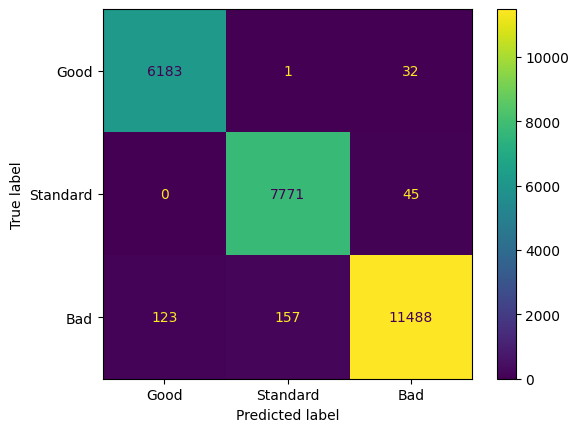

                     Validation Dataset                     

Classification Report (Validation):

              precision    recall  f1-score   support

        Good       0.92      0.94      0.93       767
    Standard       0.91      0.94      0.93      1008
         Bad       0.93      0.90      0.91      1451

    accuracy                           0.92      3226
   macro avg       0.92      0.93      0.92      3226
weighted avg       0.92      0.92      0.92      3226


Confusion Matrix (Validation):



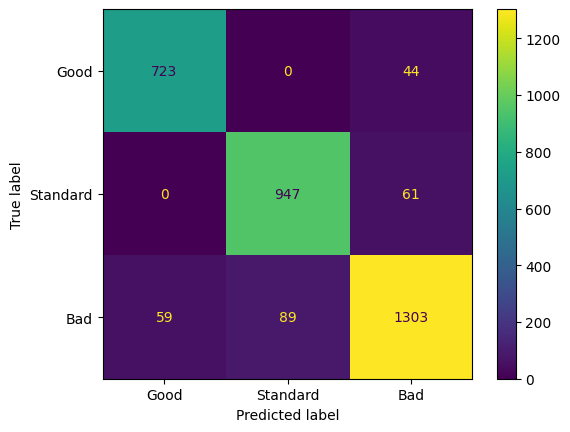



Training Accuracy   : 0.9861240310077519
Validation Accuracy : 0.921574705517669


In [29]:
def evaluate_model(model, X_train, y_train, X_val, y_val, labels):
    """
    This function evaluates a trained model on both training and validation data.
    It displays the classification report, confusion matrix, and accuracy for each dataset.
    
    Parameters:
    - model: The trained model to evaluate.
    - X_train, X_val: Feature sets for training and validation.
    - y_train, y_val: True labels for training and validation (in categorical format).
    - labels: List of class labels (e.g., ['Good', 'Standard', 'Bad']).
    """

    # Predict on training and validation data
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    
    # Training Classification Report and Confusion Matrix
    print("Training Dataset".center(60))
    print("\nClassification Report (Training):\n")
    print(classification_report(y_train, y_train_pred, target_names=labels))
    
    print("\nConfusion Matrix (Training):\n")
    ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred, display_labels=labels)
    plt.show()

    # Validation Classification Report and Confusion Matrix
    print("Validation Dataset".center(60))
    print("\nClassification Report (Validation):\n")
    print(classification_report(y_val, y_val_pred, target_names=labels))
    
    print("\nConfusion Matrix (Validation):\n")
    ConfusionMatrixDisplay.from_predictions(y_val, y_val_pred, display_labels=labels)
    plt.show()

    # Calculate and print accuracies
    train_accuracy = accuracy_score(y_train, y_train_pred)
    val_accuracy = accuracy_score(y_val, y_val_pred)
    
    print(f"\n\nTraining Accuracy   : {train_accuracy}")
    print(f"Validation Accuracy : {val_accuracy}")

# Example of how to call the function:
labels = ['Good', 'Standard', 'Bad']

# Call the function to evaluate the model
evaluate_model(best_model, X_train, y_train, X_val, y_val, labels)


                        Test Dataset                        

Classification Report (Test):

              precision    recall  f1-score   support

        Good       0.92      0.96      0.94       769
    Standard       0.93      0.93      0.93       966
         Bad       0.93      0.91      0.92      1490

    accuracy                           0.93      3225
   macro avg       0.93      0.93      0.93      3225
weighted avg       0.93      0.93      0.93      3225


Confusion Matrix (Test):



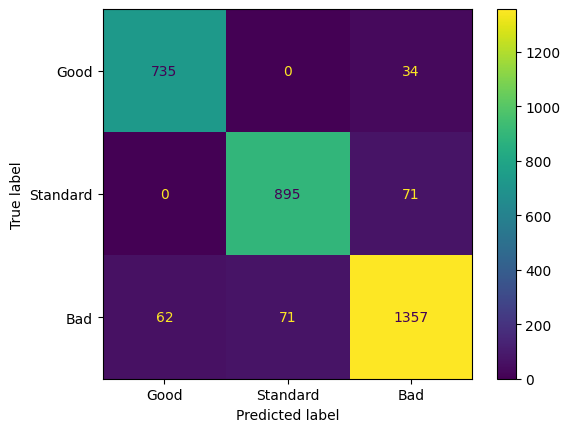



Test Accuracy   : 0.9262015503875969


In [30]:
def evaluate_model_on_test(model, X_test, y_test, labels):
    """
    This function evaluates a trained model on the test data.
    It displays the classification report, confusion matrix, and 
    accuracy for the test dataset.
    
    Parameters:
    - model: The trained model to evaluate.
    - X_test: Feature set for testing.
    - y_test: True labels for testing (in categorical format).
    - labels: List of class labels (e.g., ['Good', 'Standard', 'Bad']).
    """
    
    # Predict on the test data
    y_test_pred = model.predict(X_test)
    
    # Test Classification Report and Confusion Matrix
    print("Test Dataset".center(60))
    print("\nClassification Report (Test):\n")
    print(classification_report(y_test, y_test_pred, target_names=labels))
    
    print("\nConfusion Matrix (Test):\n")
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred, display_labels=labels)
    plt.show()

    # Calculate and print test accuracy
    test_accuracy = accuracy_score(y_test, y_test_pred)
    print(f"\n\nTest Accuracy   : {test_accuracy}")

# Example of how to call the function:
labels = ['Good', 'Standard', 'Bad']

# Call the function to evaluate the model on test data
evaluate_model_on_test(best_model, X_test, y_test, labels)


# Need Work

`Precision` and `Recall` : The model shows high precision and recall across all classes, indicating that when it predicts a class, it's often correct. This is particularly important for credit scoring, as misclassifying customers could lead to financial losses.

`F1-score` : The F1-score, which balances precision and recall, is high for all classes. This indicates a good balance between precision and recall, essential for a reliable credit scoring model.

`Confusion Matrix` : It shows that the model has correctly classified the majority of instances for each class. Also, misclassifications are mostly evenly distributed across classes, indicating that the model is not biased towards any particular class.

`Accuracy` : The overall accuracy of the model is high (96.2%), indicating that it performs well across all classes.

In [31]:
utils.display_tree(best_model)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.611633 to fit



# Deep Learning model 

# Choice for the best model

# SVM

In [ ]:
# # Create SVC classifier
# svc = SVC(random_state=42)

# # Define parameter grid
# param_grid = {
#     'C': [0.1, 1, 10], 
#     'kernel': ['linear', 'rbf'],  
#     'gamma': ['scale', 'auto'],  
#     'decision_function_shape':['ovo', 'ovr'],
#     'max_iter':[100,500,1000]
# }

# # Create GridSearchCV
# grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=5, scoring='accuracy')

# # Fit the GridSearchCV to the training data
# grid_search.fit(X_train, y_train)

# # Get the best parameters and best score
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_

# print("Best Parameters:", best_params)
# print("Best Score:", best_score)

In [ ]:
# # Create SVC classifier
# svc = SVC(random_state=42)

# # Define parameter grid
# param_grid = {
#     'C': [0.1, 1, 10],
#     'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
#     'gamma': ['scale', 'auto', 0.1],
#     'degree': [2, 3, 4], 
#     'coef0': [0.0, 0.1, 0.5],
#     'decision_function_shape': ['ovo', 'ovr'],
#     'max_iter':[10,50,100]

# }


# # Create GridSearchCV
# grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=5, scoring='accuracy')

# # Fit the GridSearchCV to the training data
# grid_search.fit(X_train, y_train)

# # Get the best parameters and best score
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_

# print("Best Parameters:", best_params)
# print("Best Score:", best_score)

# First SVM Model

In [ ]:
# best_svm_1 = SVC(C= 0.1, coef0= 0.0, decision_function_shape= 'ovo', degree= 2, gamma= 'scale', kernel= 'rbf', max_iter= 10, random_state=42)

# # Fit the new classifier on the training data
# best_svm_1.fit(X_train, y_train)

In [ ]:
# y_train_pred = best_svm_1.predict(X_train)
# y_val_pred = best_svm_1.predict(X_validation)

# # Generate and display the classification report and confusion matrix for the training dataset
# print("Training Dataset".center(60))
# print("\nClassification Report:\n")
# print(classification_report(y_train, y_train_pred))
# print("\n\nConfusion Matrix:\n")
# plot_confusion_matrix(y_train, y_train_pred, labels)
# print('\n\n')


# # Generate and display the classification report and confusion matrix for the validation dataset
# print("Validation Dataset".center(60))
# print("\nClassification Report:\n")
# print(classification_report(y_validation, y_val_pred))
# print("\n\nConfusion Matrix:\n")
# plot_confusion_matrix(y_validation, y_val_pred, labels)

# # Calculate training and validation accuracies
# train_accuracy = accuracy_score(y_train, y_train_pred)
# validation_accuracy = accuracy_score(y_validation, y_val_pred)

# # Print training and validation accuracies
# print(f"\n\nTraining Accuracy   : {train_accuracy}")
# print(f"Validation Accuracy : {validation_accuracy}")